In [1]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import plotly.express as px
import seaborn as sns
import cufflinks as cf

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

## Basics

In [2]:
arr=np.random.randn(50,4)
df_1=pd.DataFrame(arr,columns=['A','B','C','D'])
df_1.head()

,A,B,C,D
0,1.435750,0.577992,0.231399,-1.107292
1,0.223540,-1.522377,-1.846154,0.740095
2,-0.321468,-0.892931,0.403172,0.578774
3,0.536804,-1.264504,-0.900235,-0.938235
4,-0.835061,0.504843,1.040501,0.835948


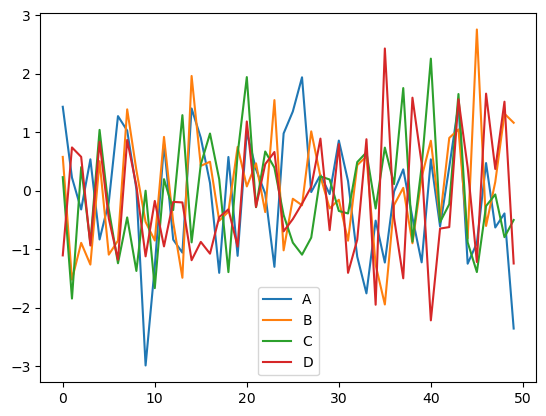

In [3]:
df_1.plot();

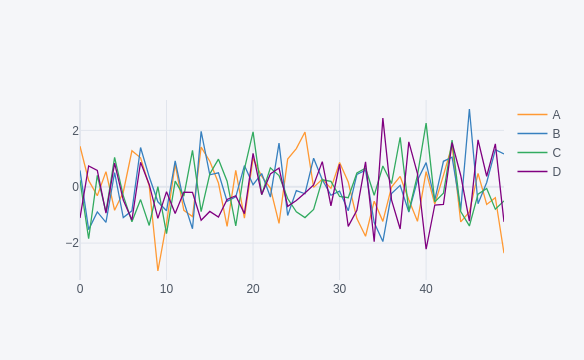

In [4]:
df_1.iplot()

# Line PLot

In [5]:
import plotly.graph_objects as go
df_stocks= px.data.stocks()







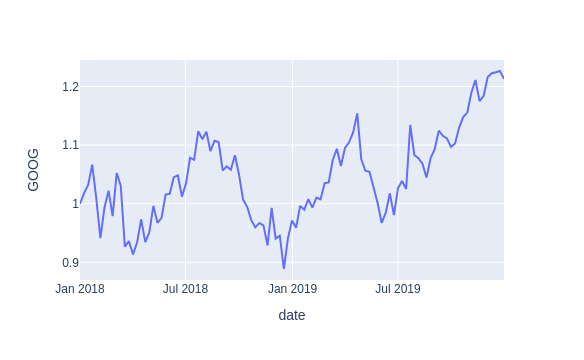

In [6]:
px.line(df_stocks,x='date',y='GOOG',labels={'x': 'Date','y':'Price'})

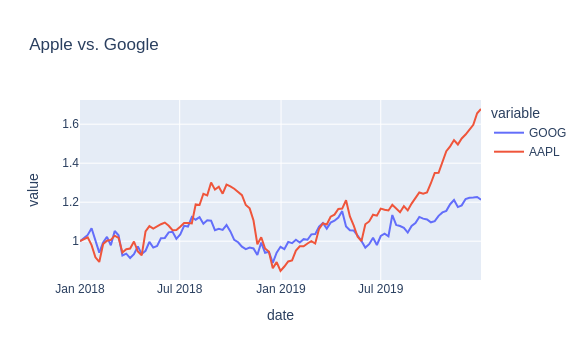

In [7]:
px.line(df_stocks, x='date',y=['GOOG','AAPL'],labels={'x': 'Date','y':'Price'},
        title='Apple vs. Google')

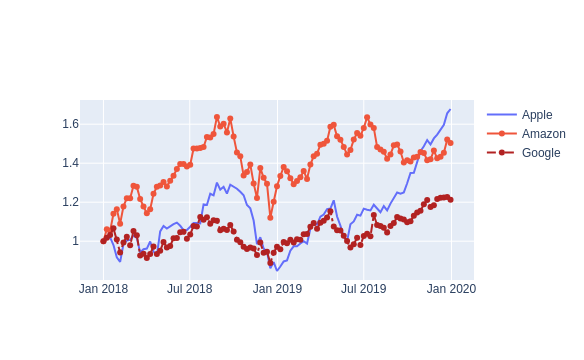

In [8]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date,y=df_stocks.AAPL,mode='lines',
                         name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date,y=df_stocks.AMZN,mode='lines+markers',
                         name='Amazon'))
fig.add_trace(go.Scatter(x=df_stocks.date,y=df_stocks.GOOG,mode='lines+markers',
                         name='Google',line=dict(
    color='firebrick',width=2,dash='dashdot')))

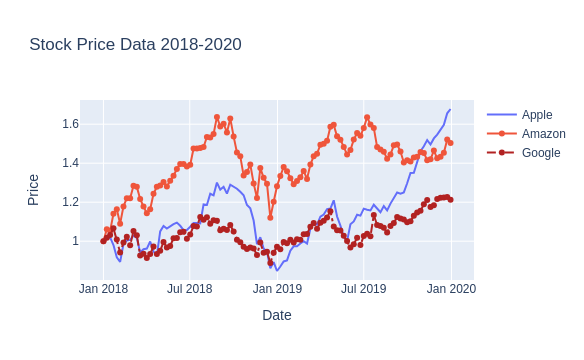

In [9]:
fig.update_layout(title='Stock Price Data 2018-2020',yaxis_title='Price',xaxis_title='Date')

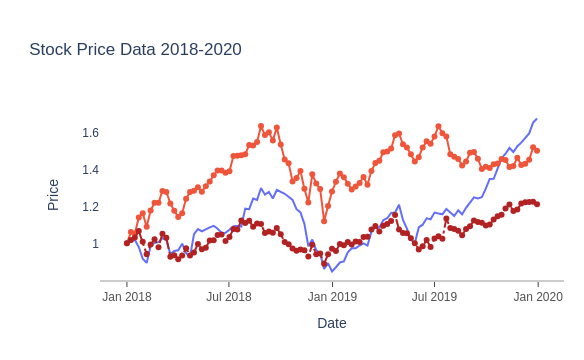

In [10]:
fig.update_layout(
    xaxis=dict(
        showline=True,showgrid=False,showticklabels=True,linecolor='rgb(204,204,204)',
        linewidth=2,ticks='outside',tickfont=dict(
            family='Arial',size=12,color='rgb(82,82,82)',
        ),
    ),
    yaxis=dict(
        showline=False,showgrid=False,showticklabels=True,zeroline=False),
    autosize=False,
    margin=dict(
        autoexpand=False,l=100,r=20,t=110,),
    showlegend=False, plot_bgcolor='white')

#Doing nothing along y axis to show diff

# Bar Charts

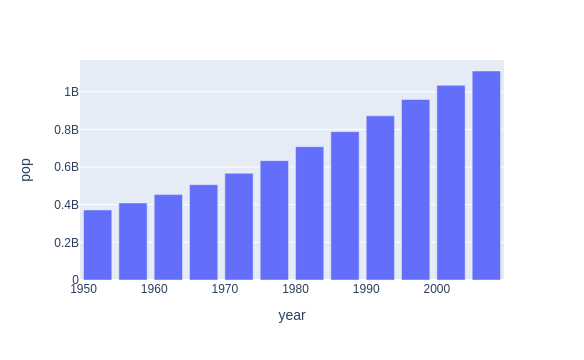

In [11]:
df_in = px.data.gapminder().query("country=='India'") #Accesing pre-built data from plotly
px.bar(df_in,x='year',y='pop')

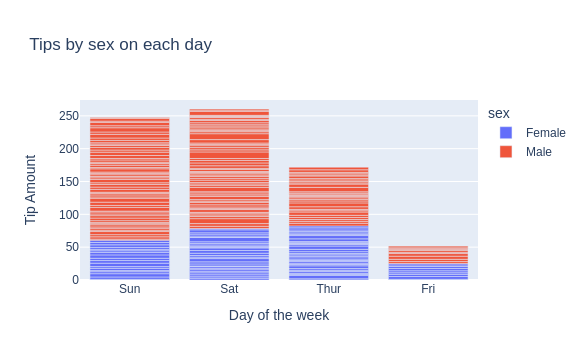

In [12]:
df_tips=px.data.tips()
px.bar(df_tips,x='day',y='tip',color='sex',title='Tips by sex on each day',
      labels={'tip': 'Tip Amount', 'day': 'Day of the week'})

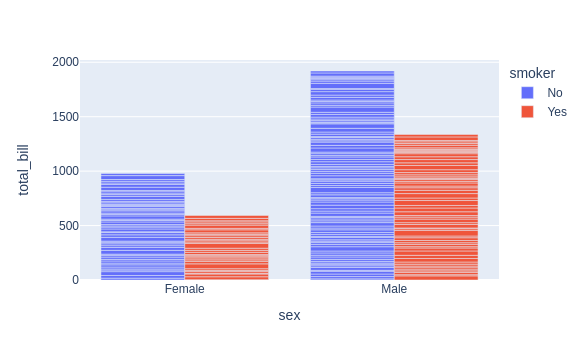

In [13]:
px.bar(df_tips,x='sex',y='total_bill',color='smoker',barmode='group')

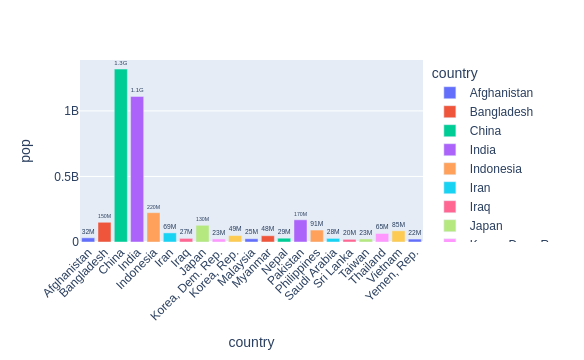

In [14]:
df_asia= px.data.gapminder().query("continent=='Asia' and year==2007 and pop > 2.e7 ")
fig=px.bar(df_asia,y='pop',x='country',text='pop',color='country')
fig.update_traces(texttemplate='%{text:.2s}',textposition='outside')
fig.update_layout(uniformtext_minsize=8,xaxis_tickangle=-45)
fig

# Scatter Plots

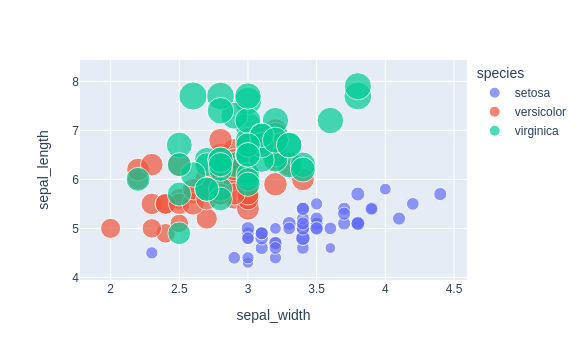

In [15]:
df_iris=px.data.iris()
px.scatter(df_iris,x='sepal_width',y='sepal_length',color='species',
           size='petal_length',hover_data=['petal_width'])

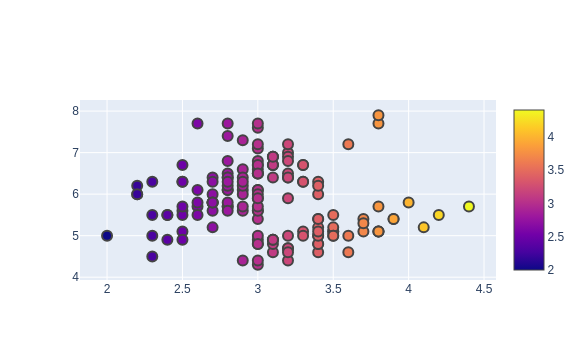

In [16]:
fig=go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width,
    y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species,
    marker=dict(
        showscale=True
    )
))
fig.update_traces(
    marker_line_width=2,
    marker_size=10
)

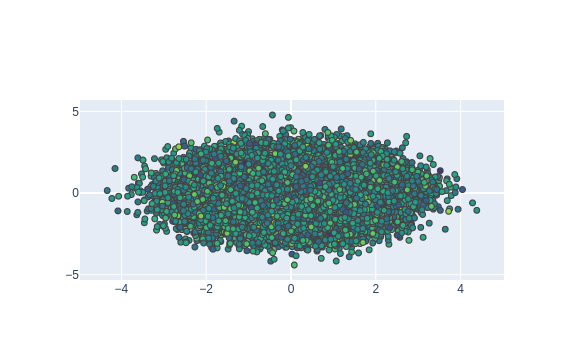

In [17]:
fig=go.Figure(
    data=go.Scattergl(
        x=np.random.randn(100000),
        y=np.random.randn(100000),
        mode='markers',
        marker=dict(
            color=np.random.randn(100000),
            colorscale='Viridis',
            line_width=1
        )
    )
)
fig

# Pie Charts

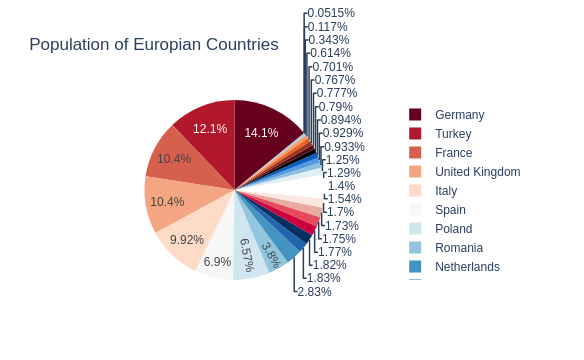

In [18]:
df_europe=px.data.gapminder().query("year==2007").query("continent=='Europe'")
px.pie(df_europe,values='pop', names='country',
       title='Population of Europian Countries',
       color_discrete_sequence=px.colors.sequential.RdBu)

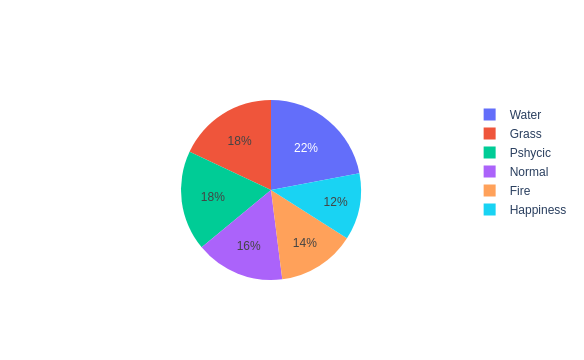

In [19]:
colors=['blue','green','black','purple','red','yellow']
fig=go.Figure(
    data=[
        go.Pie(
            labels=[
                'Water','Grass','Normal',
                'Pshycic','Fire','Happiness'
            ],
            values=[110,90,80,90,70,60]
        )
    ]
)
fig

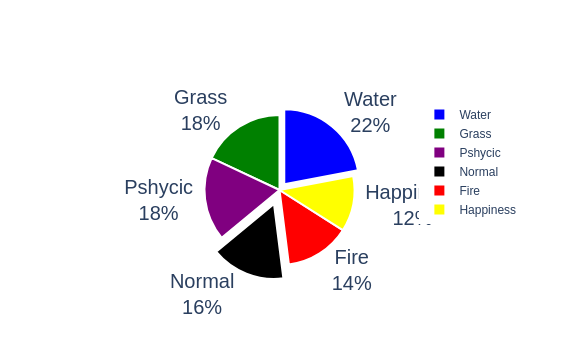

In [20]:
fig.update_traces(hoverinfo='label+percent',textfont_size=20,textinfo='label+percent',
                 pull=[0.1,0,0.2,0,0,0],
                 marker=dict(
                     colors=colors,
                     line=dict(
                         color='#FFFFFF',
                         width=2
                     )
                 ))
fig

# Histogram

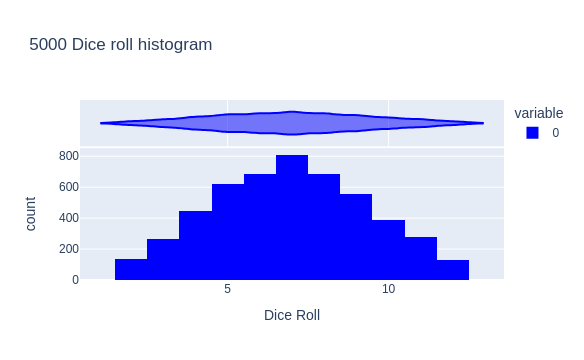

In [21]:
dice_1=np.random.randint(1,7,5000)
dice_2=np.random.randint(1,7,5000)
dice_sum=dice_1+dice_2
fig=px.histogram(dice_sum,nbins=11,
                 labels={'value':'Dice Roll'},
                title='5000 Dice roll histogram',
                marginal='violin',
                color_discrete_sequence=['blue'])
fig

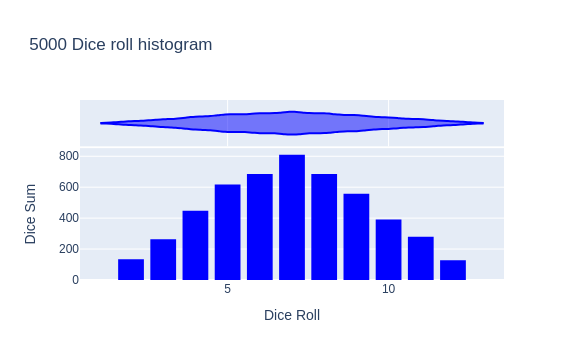

In [22]:
fig.update_layout(
    xaxis_title_text='Dice Roll',
    yaxis_title_text='Dice Sum',
    bargap=0.2,
    showlegend=False
)
fig

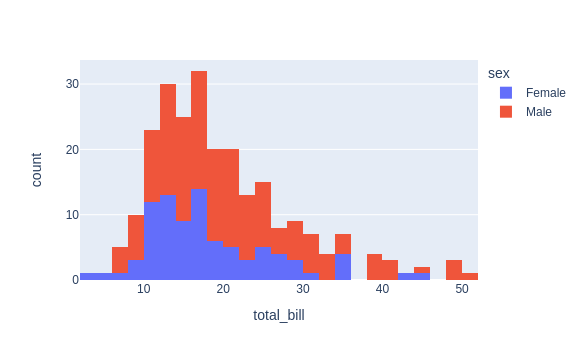

In [23]:
df_tips=px.data.tips()
px.histogram(df_tips,x='total_bill',color='sex')

# Box Plots

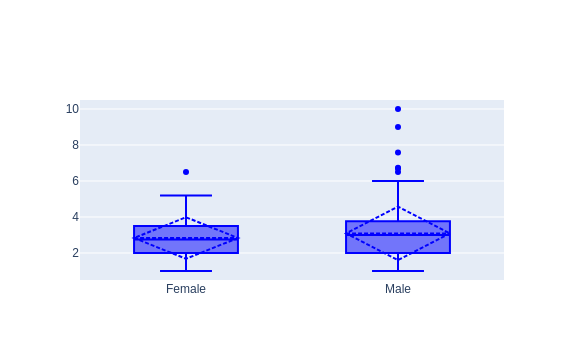

In [24]:
df_tips=px.data.tips()
px.box(df_tips,x='sex',y='tip',points='all')

px.box(df_tips, x='day',y='tip',color='sex')

fig=go.Figure()
fig.add_trace(go.Box(x=df_tips.sex,y=df_tips.tip,marker_color='blue',
                    boxmean='sd'))

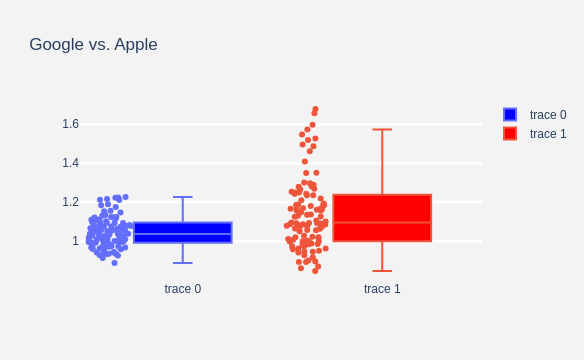

In [25]:
df_stocks=px.data.stocks()
fig=go.Figure()
fig.add_trace(go.Box(y=df_stocks.GOOG,boxpoints='all',
                    fillcolor='blue', jitter=0.5,
                    whiskerwidth=0.2))
fig.add_trace(go.Box(y=df_stocks.AAPL,boxpoints='all',
                    fillcolor='red', jitter=0.5,
                    whiskerwidth=0.2))
fig.update_layout(title='Google vs. Apple',
                 yaxis=dict(
                     gridcolor='rgb(255,255,255)',
                     gridwidth=3
                 ),paper_bgcolor='rgb(243,243,243)',
                 plot_bgcolor='rgb(243,243,243)')

# Violin Plots

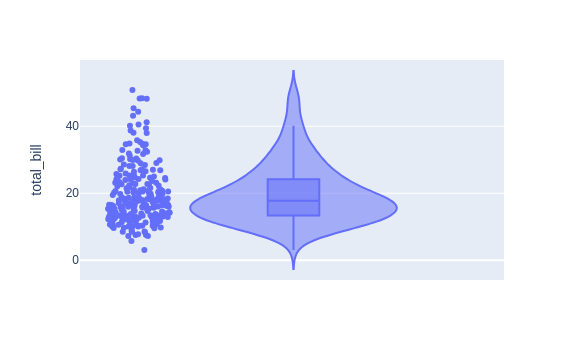

In [26]:
df_tips=px.data.tips()
px.violin(df_tips,y="total_bill",box=True,points='all')

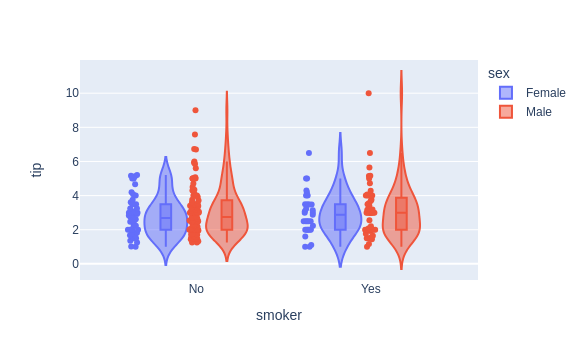

In [27]:
px.violin(df_tips,y="tip", x="smoker", color="sex",box=True,
         points="all", hover_data=df_tips.columns)

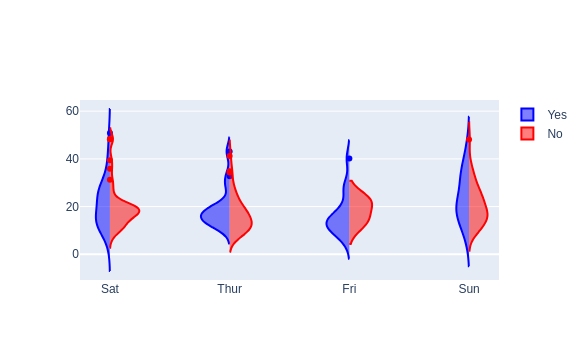

In [28]:
fig=go.Figure()
fig.add_trace(
    go.Violin(x=df_tips['day'][df_tips['smoker']=='Yes'],
             y=df_tips['total_bill'][df_tips['smoker']=='Yes'],
             legendgroup='Yes',scalegroup='Yes',name='Yes',
              side='negative',line_color='blue')
)
fig.add_trace(
    go.Violin(x=df_tips['day'][df_tips['smoker']=='No'],
             y=df_tips['total_bill'][df_tips['smoker']=='No'],
             legendgroup='Yes',scalegroup='Yes',name='No',
              side='positive',line_color='red')
)

# Density Heatmaps

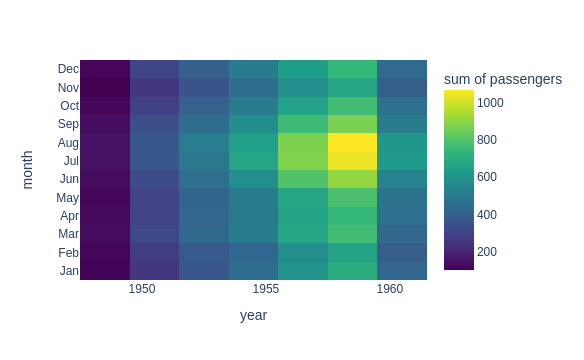

In [29]:
flights=sns.load_dataset("flights")
flights

fig=px.density_heatmap(flights,x='year',y='month',z='passengers',color_continuous_scale='Viridis')
fig

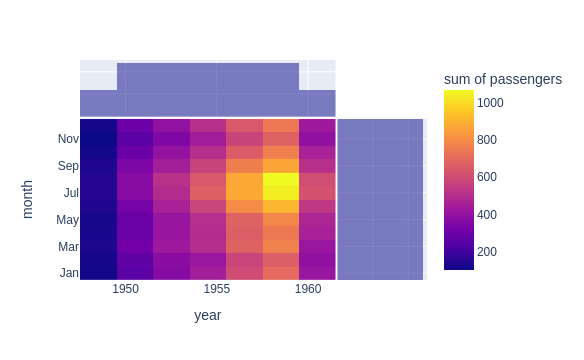

In [30]:
fig=px.density_heatmap(flights,x='year',y='month',z='passengers',
                       marginal_x='histogram',
                      marginal_y='histogram')
fig